In [1]:
import os
import tensorflow as tf
import numpy as np

In [115]:
# import dataset from directory
DIR_PATH = os.path.join('Detectors', 'cleaned_data', 'forest_dataset_all')
IMAGE_SIZE = 244
BATCH_SIZE = 32
# =============================
# Create Image Dataset form Directory
# =============================
ds_train = tf.keras.preprocessing.image_dataset_from_directory(
    DIR_PATH,
    labels='inferred',
    label_mode='int',
    color_mode='rgb',
    batch_size=32,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    shuffle=True,
    seed=123,
    validation_split=0.1,
    subset='training'

)
ds_val = tf.keras.preprocessing.image_dataset_from_directory(
    DIR_PATH,
    labels='inferred',
    label_mode='int',
    color_mode='rgb',
    batch_size=32,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    shuffle=True,
    seed=123,
    validation_split=0.1,
    subset='validation'
)

Found 1040 files belonging to 2 classes.
Using 936 files for training.
Found 1040 files belonging to 2 classes.
Using 104 files for validation.


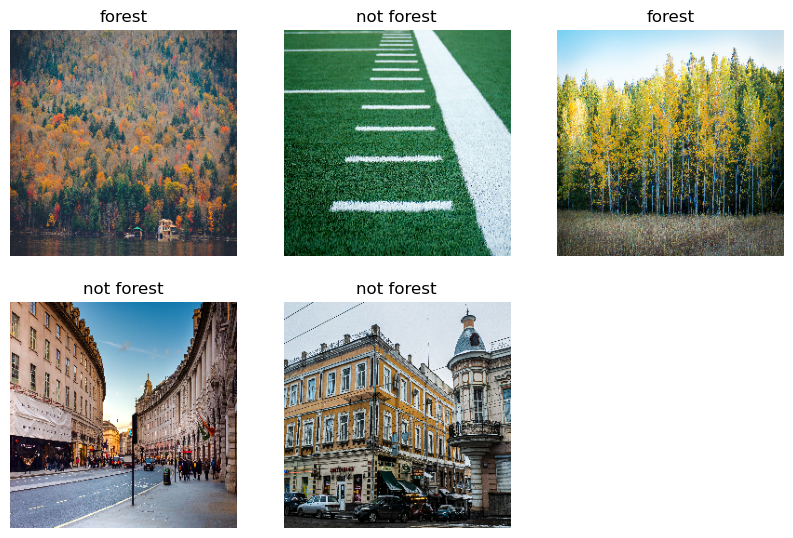

In [116]:
# Visualize data
images = None
labels = None
class_names = ds_train.class_names
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 10))
for images, labels in ds_train.take(1):
    for i in range(5):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [117]:
# data augmentation
with tf.device('/CPU:0'): # for Apple Silicon which does not yet support random() with GPU
    augmentation = tf.keras.Sequential([
        tf.keras.layers.experimental.preprocessing.RandomContrast((0.4, 0.6)),
        tf.keras.layers.experimental.preprocessing.RandomFlip(mode="horizontal"),
        tf.keras.layers.experimental.preprocessing.RandomZoom(height_factor=(0, -0.2),
                                                              width_factor=(0, -0.2)),
    ])

In [118]:
AUTOTUNE = tf.data.AUTOTUNE

augmented_ds_train = ds_train.map(
    lambda x, y: (augmentation(x, training=True), y),
    num_parallel_calls=AUTOTUNE
)

augmented_ds_train = augmented_ds_train.cache()
augmented_ds_train = augmented_ds_train.prefetch(buffer_size=10)

In [119]:
rescaling = tf.keras.Sequential([
    # rescaling
    tf.keras.layers.experimental.preprocessing.Rescaling(1./255)
])

In [147]:
model = tf.keras.models.Sequential(
    [
        rescaling,
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu',
                               kernel_regularizer=tf.keras.regularizers.l2(0.01)),
        # tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),

        tf.keras.layers.Conv2D(128, (3, 3), activation='relu',
                               kernel_regularizer=tf.keras.regularizers.l2(0.01)),
        # tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),

        tf.keras.layers.Conv2D(256, (3, 3), activation='relu',
                               kernel_regularizer=tf.keras.regularizers.l2(0.01)),
        # tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),

        tf.keras.layers.Conv2D(128, (3, 3), activation='relu',
                               kernel_regularizer=tf.keras.regularizers.l2(0.01)),
        # tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),

        tf.keras.layers.Conv2D(64, (3, 3), activation='relu',
                               kernel_regularizer=tf.keras.regularizers.l2(0.01)),
        # tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D((2, 2)),

        tf.keras.layers.GlobalAveragePooling2D(),
        # tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(64, activation="relu"),
        tf.keras.layers.Dense(32, activation="relu"),
        tf.keras.layers.Dense(2, activation='softmax')
    ]
)

In [148]:
model.build(input_shape=(None, IMAGE_SIZE, IMAGE_SIZE, 3))
model.summary()

Model: "sequential_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_26 (Sequential)  (None, 244, 244, 3)       0         
                                                                 
 conv2d_101 (Conv2D)         (None, 242, 242, 64)      1792      
                                                                 
 max_pooling2d_98 (MaxPoolin  (None, 121, 121, 64)     0         
 g2D)                                                            
                                                                 
 conv2d_102 (Conv2D)         (None, 119, 119, 128)     73856     
                                                                 
 max_pooling2d_99 (MaxPoolin  (None, 59, 59, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_103 (Conv2D)         (None, 57, 57, 256)     

In [149]:
model.compile(optimizer="adam",
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [150]:
history = model.fit(augmented_ds_train, epochs=50, validation_data=ds_val)

Epoch 1/50


2022-12-03 16:42:28.781083: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


30/30 [==============================] - ETA: 0s - loss: 2.9911 - accuracy: 0.6058

2022-12-03 16:42:32.836548: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


30/30 [==============================] - 9s 281ms/step - loss: 2.9911 - accuracy: 0.6058 - val_loss: 1.2255 - val_accuracy: 0.6635
Epoch 2/50
30/30 [==============================] - 8s 261ms/step - loss: 0.9205 - accuracy: 0.6068 - val_loss: 0.6557 - val_accuracy: 0.6635
Epoch 3/50
30/30 [==============================] - 8s 266ms/step - loss: 0.7087 - accuracy: 0.6613 - val_loss: 0.6719 - val_accuracy: 0.6442
Epoch 4/50
30/30 [==============================] - 8s 259ms/step - loss: 0.6659 - accuracy: 0.6763 - val_loss: 0.6284 - val_accuracy: 0.7212
Epoch 5/50
30/30 [==============================] - 8s 261ms/step - loss: 0.6667 - accuracy: 0.6774 - val_loss: 0.5601 - val_accuracy: 0.7404
Epoch 6/50
30/30 [==============================] - 8s 259ms/step - loss: 0.6227 - accuracy: 0.7158 - val_loss: 0.6526 - val_accuracy: 0.6635
Epoch 7/50
30/30 [==============================] - 8s 258ms/step - loss: 0.6485 - accuracy: 0.6934 - val_loss: 0.5401 - val_accuracy: 0.7596
Epoch 8/50
30/30 

In [109]:
test_loss, test_acc = model.evaluate(ds_val)
print(test_acc)

2/2 [==============================] - 3s 80ms/step - loss: 0.4521 - accuracy: 0.8254
0.8253968954086304


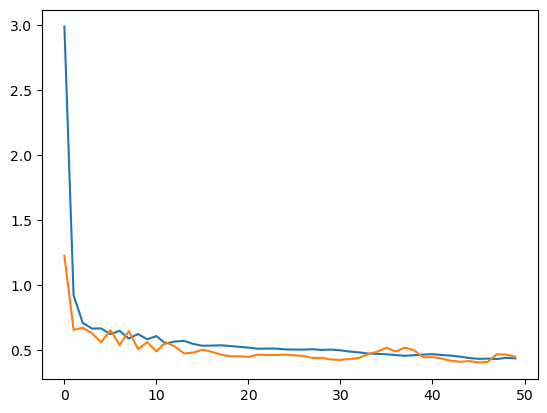

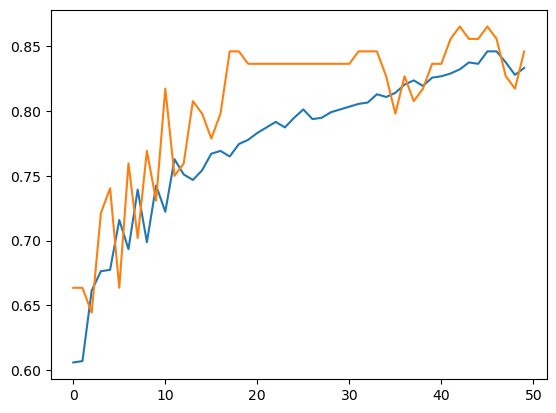

In [151]:
train_loss = history.history['loss']
train_acc = history.history['accuracy']

val_loss = history.history['val_loss']
val_acc = history.history['val_accuracy']

plt.plot(train_loss)
plt.plot(val_loss)
plt.show()
plt.plot(train_acc)
plt.plot(val_acc)
plt.show()

In [153]:
model.save(os.path.join('Detectors', "models", "forest_recognition_basics_v1.h5"))

In [155]:
class_names

['forest', 'not forest']

In [158]:
# test sample images:
import os
import numpy as np
import matplotlib.pyplot as plt
SAMPLE_DIR = os.path.join('Detectors', 'sample_images', 'forest testing')

ds_testing = tf.keras.preprocessing.image_dataset_from_directory(
    SAMPLE_DIR,
    label_mode=None,
    color_mode='rgb',
    batch_size=32,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    shuffle=True,
    seed=123,
    validation_split=None
)

Found 35 files belonging to 1 classes.


In [113]:
def get_prediction(prediction, _class_names):
    one_hot_array = prediction[0]
    max_confidence = max(one_hot_array)
    if max_confidence < 0.5:
        return 'unsure'
    else:
        return _class_names[one_hot_array.argmax()]

1/1 [==============================] - 0s 11ms/step


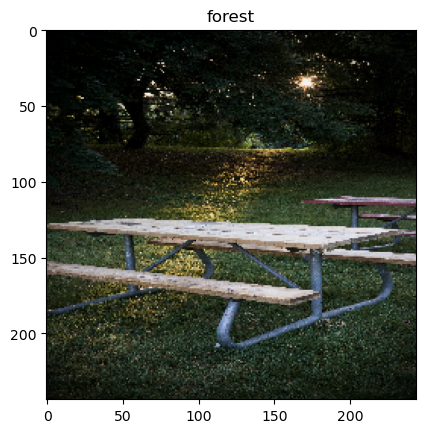

1/1 [==============================] - 0s 11ms/step


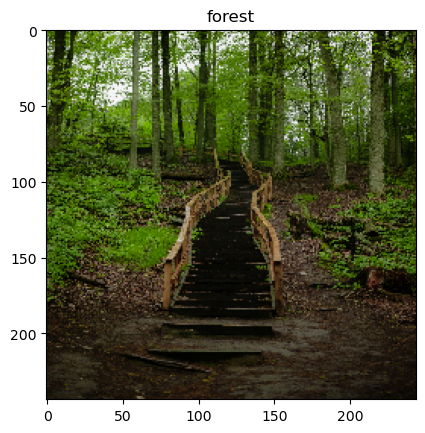

1/1 [==============================] - 0s 13ms/step


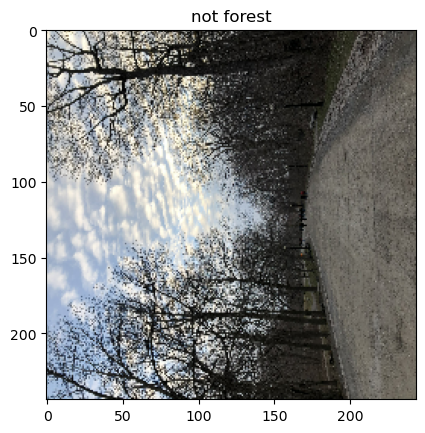

1/1 [==============================] - 0s 11ms/step


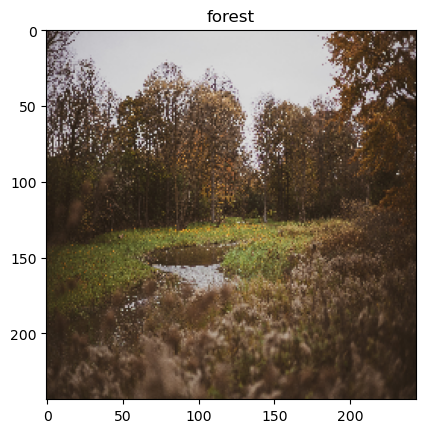

1/1 [==============================] - 0s 11ms/step


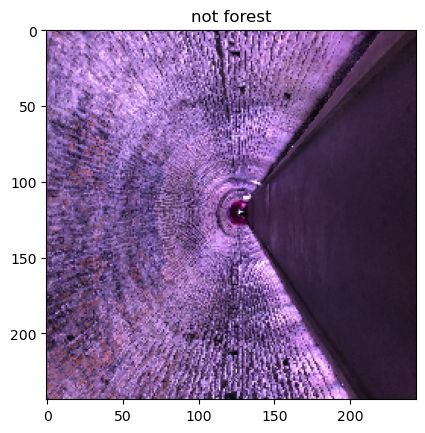

1/1 [==============================] - 0s 11ms/step


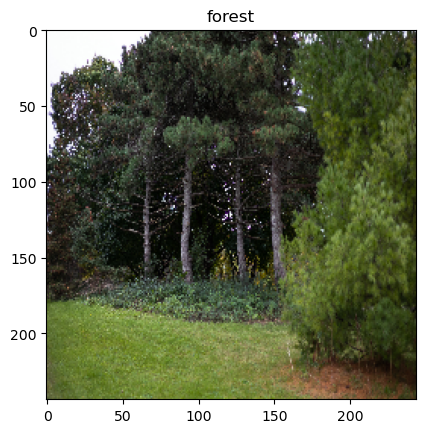

1/1 [==============================] - 0s 10ms/step


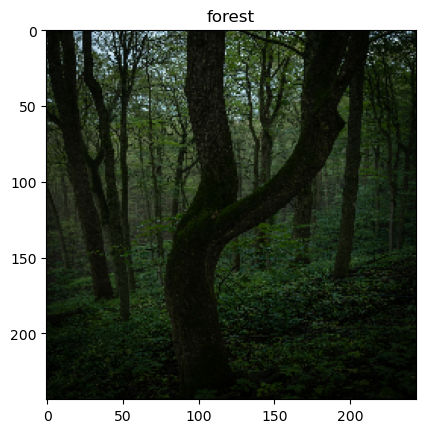

1/1 [==============================] - 0s 10ms/step


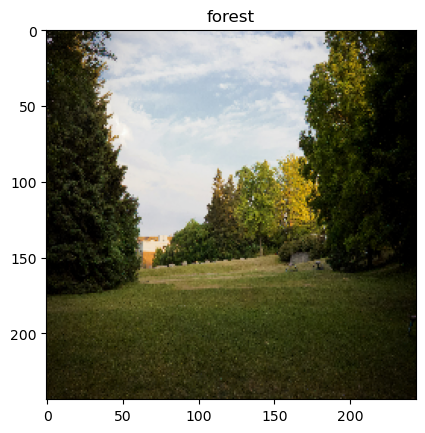

1/1 [==============================] - 0s 13ms/step


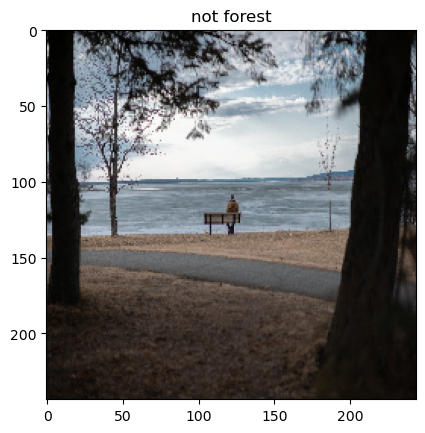

1/1 [==============================] - 0s 13ms/step


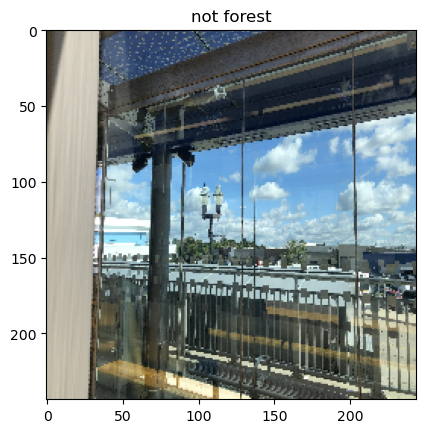

1/1 [==============================] - 0s 11ms/step


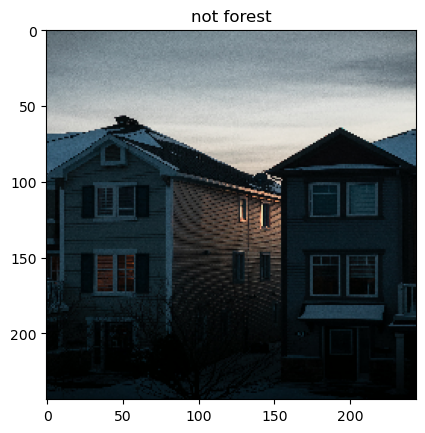

1/1 [==============================] - 0s 11ms/step


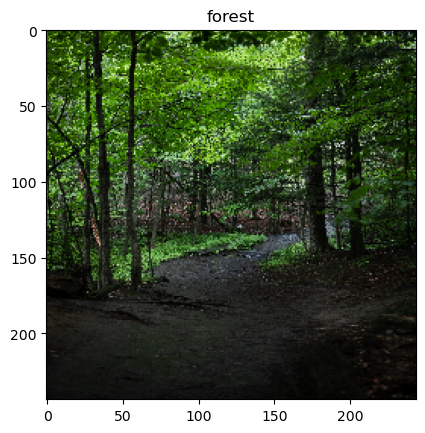

1/1 [==============================] - 0s 12ms/step


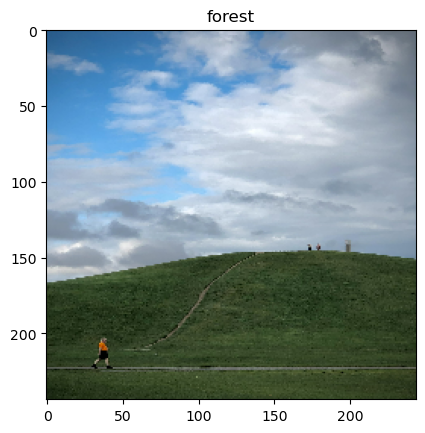

1/1 [==============================] - 0s 12ms/step


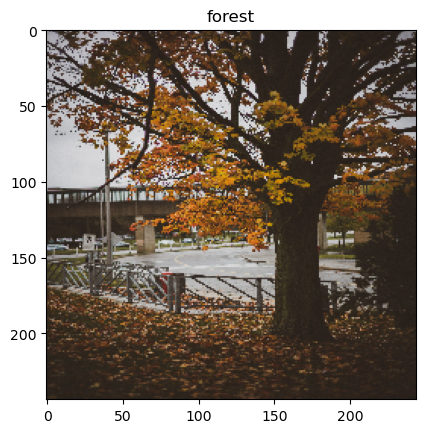

1/1 [==============================] - 0s 11ms/step


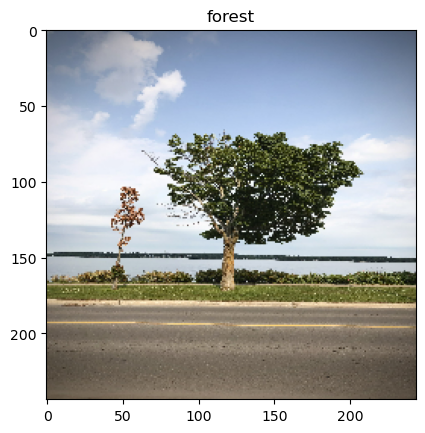

1/1 [==============================] - 0s 11ms/step


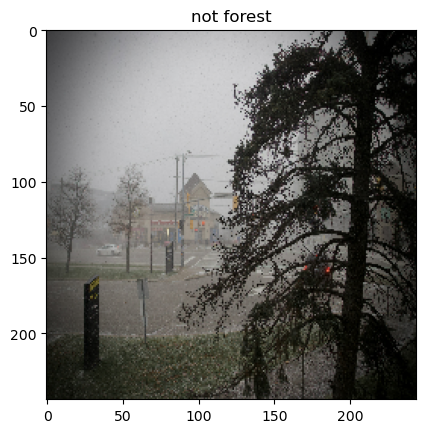

1/1 [==============================] - 0s 13ms/step


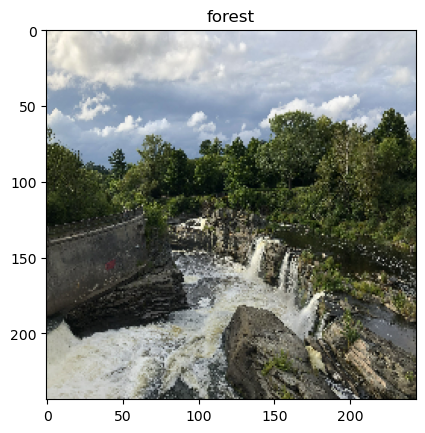

1/1 [==============================] - 0s 16ms/step


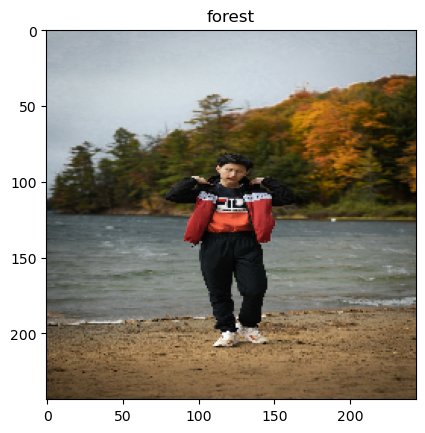

1/1 [==============================] - 0s 12ms/step


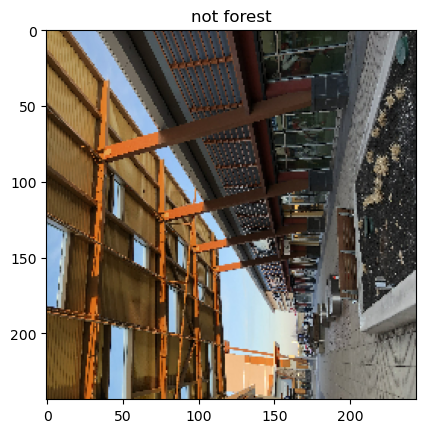

1/1 [==============================] - 0s 11ms/step


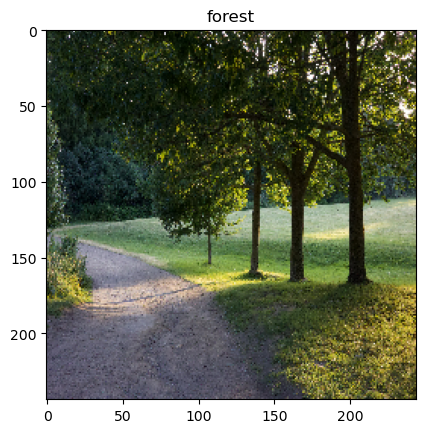

1/1 [==============================] - 0s 11ms/step


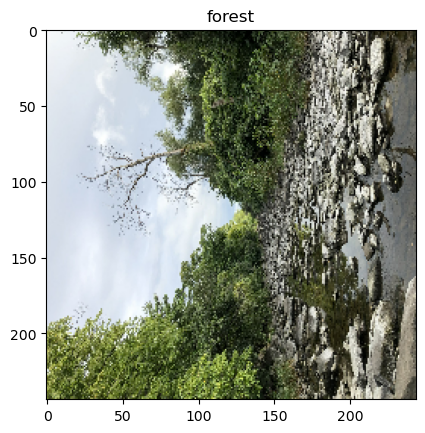

1/1 [==============================] - 0s 10ms/step


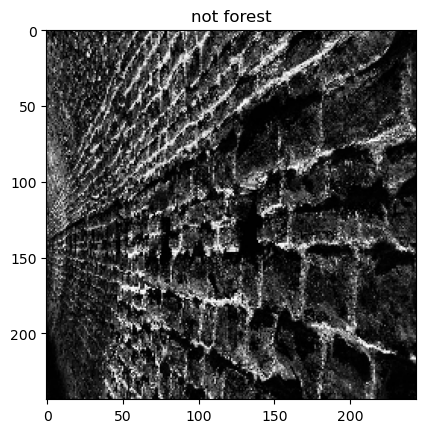

1/1 [==============================] - 0s 11ms/step


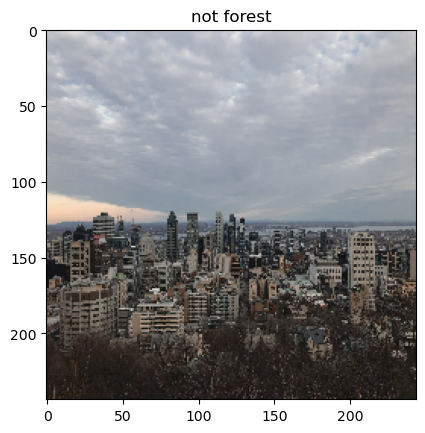

1/1 [==============================] - 0s 11ms/step


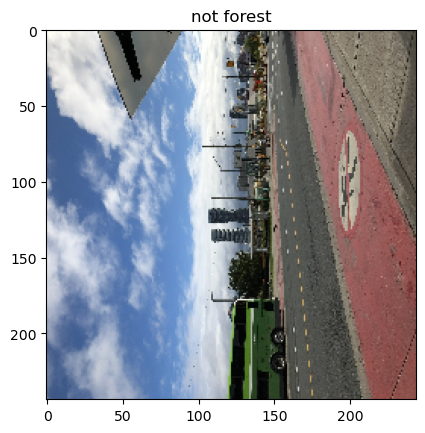

1/1 [==============================] - 0s 11ms/step


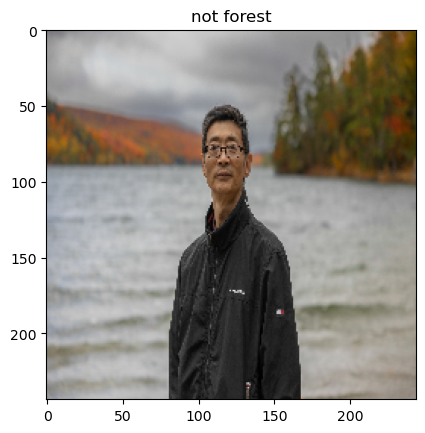

1/1 [==============================] - 0s 11ms/step


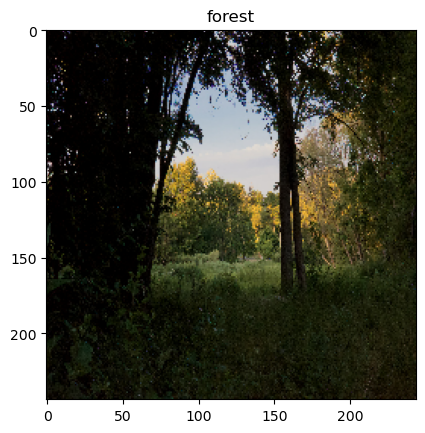

1/1 [==============================] - 0s 11ms/step


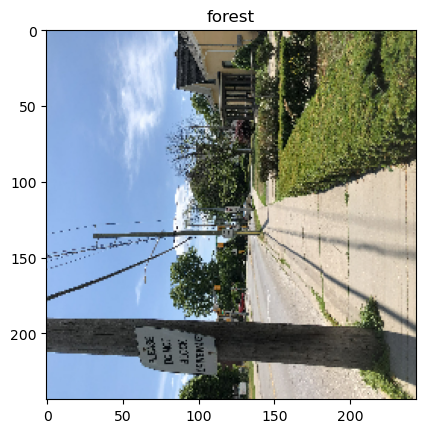

1/1 [==============================] - 0s 11ms/step


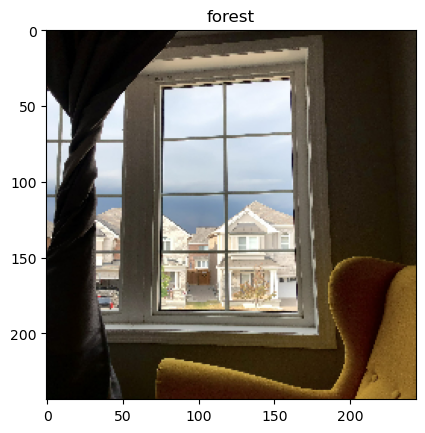

slice index 3 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 4 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 5 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 6 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 7 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 8 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 9 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 10 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 11 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 12 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 13 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/
slice index 14 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/

In [159]:
for images in ds_testing:
    for i in range(25):
        try:
            image = images[i]
            plt.imshow(image.numpy().astype("uint8"))
            predictions = model.predict(np.expand_dims(image, axis=0))
            plt.title(get_prediction(predictions, class_names))
            plt.show()
        except Exception as e:
            print(e)